In [1]:
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%matplotlib inline
import pdb
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [62]:
from config import get_config
import argparse
from PatchLearner import PatchLearnerMult
from torchvision import transforms as trans
from torch.utils.data import Dataset, ConcatDataset, DataLoader
from torchvision import transforms as trans
from torchvision.datasets import ImageFolder
from PIL import Image, ImageFile
import numpy as np
import cv2
import pickle
import torch
import sys
from torch.autograd import Variable
import torch.nn.functional as F 
import matplotlib.pyplot as plt
import PIL
%matplotlib inline
from pathlib import Path
import tqdm
from torch import nn
from torchvision import transforms as trans
from os import path
from pathlib import Path
import os

## drawing the filters

In [3]:
import torch
import torchvision.models as models
from matplotlib import pyplot as plt


def plot_kernels(tensor, num_cols=8, name=''):
    if not tensor.ndim==4:
        raise Exception("assumes a 4D tensor")
    #if not tensor.shape[-1]==3:
    #    raise Exception("last dim needs to be 3 to plot")
    num_kernels = tensor.shape[0]
    num_rows = 1+ num_kernels // num_cols
    
    fig = plt.figure(figsize=(num_cols,num_rows))
    for i in range(len(tensor)):
        ax1 = fig.add_subplot(num_rows,num_cols,i+1)
        ax1.imshow(tensor[i][0]*(np.abs(tensor[i][0])>0.0001))
        ax1.axis('off')
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        
    plt.suptitle(name)
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()

def plot_kernels_two_models(tensor, num_cols=4, name=''):
    if not tensor.ndim==4:
        raise Exception("assumes a 4D tensor")
    #if not tensor.shape[-1]==3:
    #    raise Exception("last dim needs to be 3 to plot")
    num_kernels = tensor.shape[0] // 2
    num_rows = 1+ num_kernels // num_cols
    
    fig = plt.figure(figsize=(num_cols,num_rows))
    for i in range(len(tensor)//2):
        ax1 = fig.add_subplot(num_rows,num_cols,i+1)
        ax1.imshow(tensor[i][0]*(np.abs(tensor[i][0])>0.0001))
        ax1.axis('off')
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        
    plt.suptitle(name+'_0')
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    
    fig = plt.figure(figsize=(num_cols,num_rows))
    for i in range((len(tensor)//2), len(tensor)):
        ax1 = fig.add_subplot(num_rows,num_cols,i-(len(tensor)//2)+1)
        ax1.imshow(tensor[i][0]*(np.abs(tensor[i][0])>0.0001))
        ax1.axis('off')
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        
    plt.suptitle(name+'_1')
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.show()


In [4]:
from fastai.vision.models import vgg16_bn as vgg16
from fastai.vision import get_transforms as tfms_from_model
from torch.autograd import Variable
from cv2 import resize
%matplotlib inline

In [5]:
def set_trainable(model, requires_grad):
    for param in model.parameters():
        param.requires_grad = requires_grad

In [6]:
class SaveFeatures():
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = torch.tensor(output,requires_grad=True).cuda()
    def close(self):
        self.hook.remove()

In [7]:
import warnings
warnings.filterwarnings("ignore")
class FilterVisualizer():
    def __init__(self, size=56, upscaling_steps=12, upscaling_factor=1.2):
        self.size, self.upscaling_steps, self.upscaling_factor = size, upscaling_steps, upscaling_factor
        self.model = vgg16(pretrained=True).float().eval()
        set_trainable(self.model, False)

    def visualize(self, layer, filter, lr=0.1, opt_steps=20, blur=None, save=False):
        sz = self.size
        img = (np.uint8(np.random.uniform(150, 180, (sz, sz, 3)))/255)  # generate random image
        img = Image(pil2tensor(img, img.dtype))# np.double))
        activations = SaveFeatures(list(self.model.children())[0][layer])  # register hook

        for _ in tqdm.tqdm_notebook(range(self.upscaling_steps), total=self.upscaling_steps):  # scale the image up upscaling_steps times
            train_tfms, val_tfms = tfms_from_model(vgg16, sz)
            img_var = Variable(img.apply_tfms(val_tfms).px[None]).float().detach().requires_grad_()  # convert image to Variable that requires grad
            optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)
            for n in range(opt_steps):  # optimize pixel values for opt_steps times
                optimizer.zero_grad()
                self.model(img_var)
                loss = -activations.features[0, filter].mean()
                loss.backward()
                optimizer.step()
            img = (img_var.data.cpu().numpy()[0].transpose(1,2,0)) # 
            self.output = img
            sz = int(self.upscaling_factor * sz)  # calculate new image size
            img = cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)  # scale image up
            if blur is not None: 
                img = (cv2.blur(img,(blur,blur)))  # blur image to reduce high frequency patterns
            img = Image(pil2tensor(img, img.dtype))# np.double))
        if save:
            self.save(layer, filter)
        activations.close()
        return layer
        
    def save(self, layer, filter):
        plt.imsave("layer_"+str(layer)+"_filter_"+str(filter)+".jpg", np.clip(self.output, 0, 1))

In [ ]:
layer = 40
filter_ = 265

FV = FilterVisualizer(size=56, upscaling_steps=12, upscaling_factor=1.2)
FV.visualize(layer, filter_, blur=5)

img = PIL.Image.open("layer_"+str(layer)+"_filter_"+str(filter_)+".jpg")
plt.figure(figsize=(7,7))
plt.imshow(img)

## Visualize FeatureMAP

In [64]:
"""
Created on Thu Oct 21 11:09:09 2017
@author: Utku Ozbulak - github.com/utkuozbulak
"""
import os
import copy
import numpy as np
from PIL import Image
import matplotlib.cm as mpl_color_map

import torch
from torch.autograd import Variable
from torchvision import models


def convert_to_grayscale(im_as_arr):
    """
        Converts 3d image to grayscale
    Args:
        im_as_arr (numpy arr): RGB image with shape (D,W,H)
    returns:
        grayscale_im (numpy_arr): Grayscale image with shape (1,W,D)
    """
    grayscale_im = np.sum(np.abs(im_as_arr), axis=0)
    im_max = np.percentile(grayscale_im, 99)
    im_min = np.min(grayscale_im)
    grayscale_im = (np.clip((grayscale_im - im_min) / (im_max - im_min), 0, 1))
    grayscale_im = np.expand_dims(grayscale_im, axis=0)
    return grayscale_im


data_src = '/mnt/md0/orville/Gal'
def save_gradient_images(gradient, file_name):
    """
        Exports the original gradient image
    Args:
        gradient (np arr): Numpy array of the gradient with shape (3, 224, 224)
        file_name (str): File name to be exported
    """
    if not os.path.exists(data_src+'/results'):
        os.makedirs(data_src+'/results')
    # Normalize
    gradient = gradient - gradient.min()
    gradient /= gradient.max()
    # Save image
    path_to_file = os.path.join(data_src, 'results', file_name + '.jpg')
    save_image(gradient, path_to_file)


def save_class_activation_images(org_img, activation_map, file_name):
    """
        Saves cam activation map and activation map on the original image
    Args:
        org_img (PIL img): Original image
        activation_map (numpy arr): Activation map (grayscale) 0-255
        file_name (str): File name of the exported image
    """
    if not os.path.exists(data_src+'/results'):
        os.makedirs(data_src+'/results')
    # Grayscale activation map
    heatmap, heatmap_on_image = apply_colormap_on_image(org_img, activation_map, 'hsv')
    # Save colored heatmap
    path_to_file = os.path.join(data_src, 'results', file_name+'_Cam_Heatmap.png')
    save_image(heatmap, path_to_file)
    # Save heatmap on iamge
    path_to_file = os.path.join(data_src, 'results', file_name+'_Cam_On_Image.png')
    save_image(heatmap_on_image, path_to_file)
    # SAve grayscale heatmap
    path_to_file = os.path.join(data_src, 'results', file_name+'_Cam_Grayscale.png')
    save_image(activation_map, path_to_file)


def apply_colormap_on_image(org_im, activation, colormap_name):
    """
        Apply heatmap on image
    Args:
        org_img (PIL img): Original image
        activation_map (numpy arr): Activation map (grayscale) 0-255
        colormap_name (str): Name of the colormap
    """
    # Get colormap
    color_map = mpl_color_map.get_cmap(colormap_name)
    no_trans_heatmap = color_map(activation)
    # Change alpha channel in colormap to make sure original image is displayed
    heatmap = copy.copy(no_trans_heatmap)
    heatmap[:, :, 3] = 0.4
    heatmap = Image.fromarray((heatmap*255).astype(np.uint8))
    no_trans_heatmap = Image.fromarray((no_trans_heatmap*255).astype(np.uint8))

    # Apply heatmap on iamge
    heatmap_on_image = Image.new("RGBA", org_im.size)
    heatmap_on_image = Image.alpha_composite(heatmap_on_image, org_im.convert('RGBA'))
    heatmap_on_image = Image.alpha_composite(heatmap_on_image, heatmap)
    return no_trans_heatmap, heatmap_on_image


def format_np_output(np_arr):
    """
        This is a (kind of) bandaid fix to streamline saving procedure.
        It converts all the outputs to the same format which is 3xWxH
        with using sucecssive if clauses.
    Args:
        im_as_arr (Numpy array): Matrix of shape 1xWxH or WxH or 3xWxH
    """
    # Phase/Case 1: The np arr only has 2 dimensions
    # Result: Add a dimension at the beginning
    if len(np_arr.shape) == 2:
        np_arr = np.expand_dims(np_arr, axis=0)
    # Phase/Case 2: Np arr has only 1 channel (assuming first dim is channel)
    # Result: Repeat first channel and convert 1xWxH to 3xWxH
    if np_arr.shape[0] == 1:
        np_arr = np.repeat(np_arr, 3, axis=0)
    # Phase/Case 3: Np arr is of shape 3xWxH
    # Result: Convert it to WxHx3 in order to make it saveable by PIL
    if np_arr.shape[0] == 3:
        np_arr = np_arr.transpose(1, 2, 0)
    # Phase/Case 4: NP arr is normalized between 0-1
    # Result: Multiply with 255 and change type to make it saveable by PIL
    if np.max(np_arr) <= 1:
        np_arr = (np_arr*255).astype(np.uint8)
    return np_arr


def save_image(im, path):
    """
        Saves a numpy matrix or PIL image as an image
    Args:
        im_as_arr (Numpy array): Matrix of shape DxWxH
        path (str): Path to the image
    """
    if isinstance(im, (np.ndarray, np.generic)):
        im = format_np_output(im)
        im = Image.fromarray(im)
    im.save(path)


def preprocess_image(pil_im, resize_im=True):
    """
        Processes image for CNNs
    Args:
        PIL_img (PIL_img): Image to process
        resize_im (bool): Resize to 224 or not
    returns:
        im_as_var (torch variable): Variable that contains processed float tensor
    """
    # mean and std list for channels (Imagenet)
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]
    # Resize image
    if resize_im:
        pil_im.thumbnail((224, 224))
    im_as_arr = np.float32(pil_im)
    im_as_arr = im_as_arr.transpose(2, 0, 1)  # Convert array to D,W,H
    # Normalize the channels
    for channel, _ in enumerate(im_as_arr):
        im_as_arr[channel] /= 255
        im_as_arr[channel] -= mean[channel]
        im_as_arr[channel] /= std[channel]
    # Convert to float tensor
    im_as_ten = torch.from_numpy(im_as_arr).float()
    # Add one more channel to the beginning. Tensor shape = 1,3,224,224
    im_as_ten.unsqueeze_(0)
    # Convert to Pytorch variable
    im_as_var = Variable(im_as_ten, requires_grad=True)
    return im_as_var


def recreate_image(im_as_var):
    """
        Recreates images from a torch variable, sort of reverse preprocessing
    Args:
        im_as_var (torch variable): Image to recreate
    returns:
        recreated_im (numpy arr): Recreated image in array
    """
    reverse_mean = [-0.485, -0.456, -0.406]
    reverse_std = [1/0.229, 1/0.224, 1/0.225]
    recreated_im = copy.copy(im_as_var.data.numpy()[0])
    for c in range(len(recreated_im)):
        recreated_im[c] /= reverse_std[c]
        recreated_im[c] -= reverse_mean[c]
    recreated_im[recreated_im > 1] = 1
    recreated_im[recreated_im < 0] = 0
    recreated_im = np.round(recreated_im * 255)

    recreated_im = np.uint8(recreated_im).transpose(1, 2, 0)
    return recreated_im


def get_positive_negative_saliency(gradient):
    """
        Generates positive and negative saliency maps based on the gradient
    Args:
        gradient (numpy arr): Gradient of the operation to visualize
    returns:
        pos_saliency ( )
    """
    pos_saliency = (np.maximum(0, gradient) / gradient.max())
    neg_saliency = (np.maximum(0, -gradient) / -gradient.min())
    return pos_saliency, neg_saliency


def get_example_params(example_index):
    """
        Gets used variables for almost all visualizations, like the image, model etc.
    Args:
        example_index (int): Image id to use from examples
    returns:
        original_image (numpy arr): Original image read from the file
        prep_img (numpy_arr): Processed image
        target_class (int): Target class for the image
        file_name_to_export (string): File name to export the visualizations
        pretrained_model(Pytorch model): Model to use for the operations
    """
    # Pick one of the examples
    #example_list = (('../input_images/snake.jpg', 56),
    #                ('../input_images/cat_dog.png', 243),
    #                ('../input_images/spider.png', 72))
    example_list = (('/mnt/md0/orville/Gal/snake.jpg', 56),
                    ('/mnt/md0/orville/Gal/cat_dog.png', 243),
                    ('/mnt/md0/orville/Gal/spider.png', 72))
    img_path = example_list[example_index][0]
    target_class = example_list[example_index][1]
    file_name_to_export = img_path[img_path.rfind('/')+1:img_path.rfind('.')]
    # Read image
    original_image = Image.open(img_path).convert('RGB')
    # Process image
    prep_img = preprocess_image(original_image)
    return (original_image,
            prep_img,
            target_class,
            file_name_to_export)

In [142]:
def get_layers(model):
    res = []
    for layer in model.children():
        children = get_layers(layer)
        if children == []:
            res.append(layer)
        else:
            res.extend(children)
    return res

def get_layers_gen(model):
    for layer in model.children():
        children = get_layers(layer)
        i = -1
        for i, child in enumerate(children):
            yield child
        if i<0:
            yield layer

In [173]:
"""
Created on Sat Nov 18 23:12:08 2017
@author: Utku Ozbulak - github.com/utkuozbulak
"""
import os
import numpy as np

import torch
from torch.optim import Adam
from torchvision import models

#from misc_functions import preprocess_image, recreate_image, save_image


class CNNLayerVisualization():
    """
        Produces an image that minimizes the loss of a convolution
        operation for a specific layer and filter
    """
    def __init__(self, model, selected_layer, selected_filter, device):
        self.model = model
        self.model.eval()
        self.selected_layer = selected_layer
        self.selected_filter = selected_filter
        self.conv_output = 0
        self.input_size = (224, 224, 1)
        self.device = device
        # Create the folder to export images if not exists
        if not os.path.exists('generated'):
            os.makedirs('generated')

    def hook_layer(self):
        def hook_function(module, grad_in, grad_out):
            # Gets the conv output of the selected filter (from selected layer)
            self.conv_output = grad_out[0, self.selected_filter]
        # Hook the selected layer
        get_layers(self.model)[self.selected_layer].register_forward_hook(hook_function)

    def visualise_layer_with_hooks(self):
        # Hook the selected layer
        self.hook_layer()
        # Generate a random image
        random_image = np.uint8(np.random.uniform(150, 180, self.input_size))
        # Process image and return variable
        processed_image = preprocess_image(random_image, False)
        # Define optimizer for the image
        optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-6)
        for i in tqdm.tqdm_notebook(range(1, 31), total=30, desc=str((self.selected_layer, self.selected_filter))):
            optimizer.zero_grad()
            # Assign create image to a variable to move forward in the model
            x = processed_image
            for index, layer in enumerate(get_layers_gen(self.model)):
                # Forward pass layer by layer
                # x is not used after this point because it is only needed to trigger
                # the forward hook function
                x = layer(x)
                # Only need to forward until the selected layer is reached
                if index == self.selected_layer:
                    # (forward hook function triggered)
                    break
            # Loss function is the mean of the output of the selected layer/filter
            # We try to minimize the mean of the output of that specific filter
            loss = -torch.mean(self.conv_output)
            # Backward
            loss.backward()
            # Update image
            optimizer.step()
            # Recreate image
            self.created_image = recreate_image(processed_image)
            # Save image
            if i % 5 == 0:
                im_path = 'generated/layer_vis_l' + str(self.selected_layer) + \
                    '_f' + str(self.selected_filter) + '_iter' + str(i) + '.jpg'
                save_image(self.created_image.squeeze(), im_path)

    def visualise_layer_without_hooks(self):
        # Process image and return variable
        # Generate a random image
        random_image = np.uint8(np.random.uniform(150, 180, self.input_size))
        # Process image and return variable
        processed_image = preprocess_image(random_image, False).to(self.device)
        # Define optimizer for the image
        optimizer = Adam([processed_image], lr=0.1, weight_decay=1e-6)
        for i in tqdm.tqdm_notebook(range(1, 31), total=30):
            optimizer.zero_grad()
            # Assign create image to a variable to move forward in the model
            x = processed_image
            for index, layer in enumerate(get_layers_gen(self.model)):
                # Forward pass layer by layer
                x = layer(x)
                if index == self.selected_layer:
                    # Only need to forward until the selected layer is reached
                    # Now, x is the output of the selected layer
                    break
            # Here, we get the specific filter from the output of the convolution operation
            # x is a tensor of shape 1x512x28x28.(For layer 17)
            # So there are 512 unique filter outputs
            # Following line selects a filter from 512 filters so self.conv_output will become
            # a tensor of shape 28x28
            self.conv_output = x[0, self.selected_filter]
            # Loss function is the mean of the output of the selected layer/filter
            # We try to minimize the mean of the output of that specific filter
            loss = -torch.mean(self.conv_output)
            # Backward
            loss.backward()
            # Update image
            optimizer.step()
            # Recreate image
            self.created_image = recreate_image(processed_image)
            # Save image
            if i % 5 == 0:
                im_path = 'generated/layer_vis_l' + str(self.selected_layer) + \
                    '_f' + str(self.selected_filter) + '_iter' + str(i) + '.jpg'
                save_image(self.created_image, im_path)

In [86]:
model_dir = '04-20-20250'
name_0 = "model_0_2020-05-04-20-43_accuracy:0.8006993006993007_step:20250_final.pth"
name_1 = "model_1_2020-05-04-20-43_accuracy:0.8006993006993007_step:20250_final.pth"
fixed_str = '2020-05-04-20-43_accuracy:0.8006993006993007_step:20250_final.pth'

In [9]:
conf = get_config(2)
conf.device = 'cpu'
conf.with_roi = True
learner = PatchLearnerMult(conf, inference=True)

2 resnet50 models generated


loading test: 100%|██████████| 71/71 [00:15<00:00,  4.61it/s]


In [144]:
conf.save_path = Path('work_space/save') / model_dir

In [110]:
learner.load_state(conf, fixed_str, model_only=True, from_save_folder=True) #adds a predix 'model_' to name 

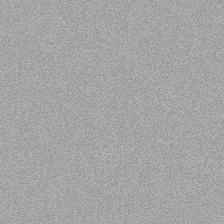

In [169]:
random_image = np.uint8(np.random.uniform(150, 180, (224,224,1)))
Image.fromarray(random_image.squeeze(), 'L')  

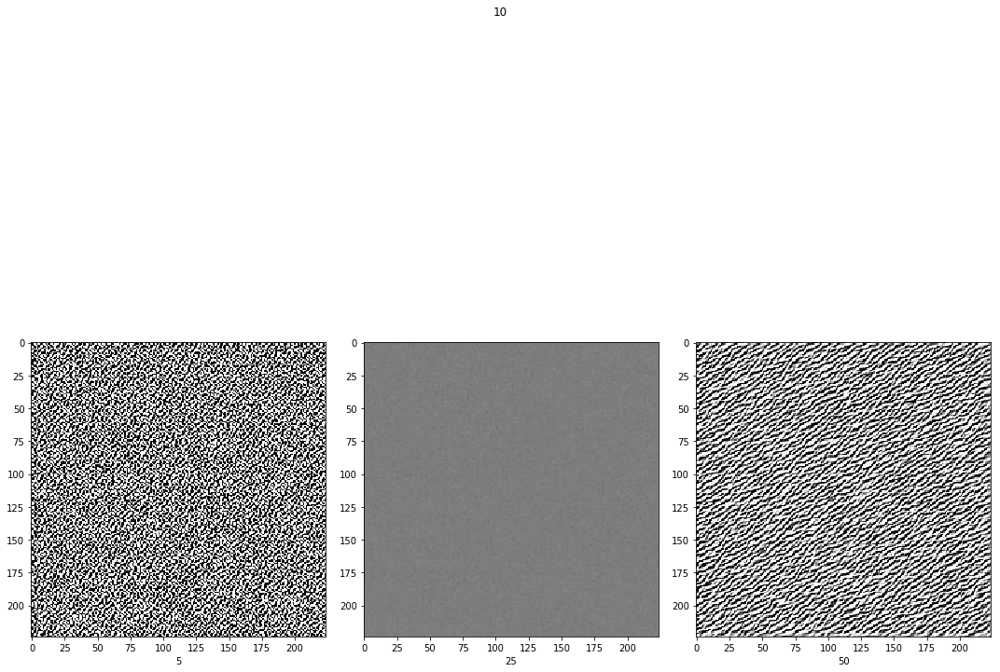

In [175]:
cnn_layer = 10
filter_poss = [5, 25, 50]
f, axes = plt.subplots(1, len(filter_poss), figsize=(15,15))

for i, filter_pos in enumerate(filter_poss):
    # Fully connected layer is not needed
    layer_vis = CNNLayerVisualization(learner.models[1][0], cnn_layer, filter_pos, 'cpu')

    # Layer visualization with pytorch hooks
    layer_vis.visualise_layer_with_hooks()

    # Layer visualization without pytorch hooks
    # layer_vis.visualise_layer_without_hooks()

    im_path = 'generated/layer_vis_l' + str(cnn_layer) + '_f' + str(filter_pos) + '_iter' + str(30) + '.jpg'
    img = PIL.Image.open(im_path)
    axes[i].imshow(img)
    axes[i].set_xlabel(filter_pos)
plt.suptitle(cnn_layer)
plt.tight_layout()

In [ ]:
name = 'model_0_2020-02-26-17-42_accuracy:0.9741428571428571_step:485220_final.pth'
name_1 = 'model_1_2020-02-26-17-42_accuracy:0.9741428571428571_step:485220_final.pth'
#checkpoint_from_scratch_15=torch.load('/mnt/md0/orville/Miriam/Prints_256x256_stn/checkpoints/model_best.pth.tar')
face_model_0=torch.load("/mnt/md0/orville/Gal/InsightFace_Pytorch/save/baseline/"+name)
#plot_kernels(face_model_0['module.input_layer.0.weight'].cpu().numpy(), name=0)

#face_model_0=torch.load("/mnt/md0/orville/Gal/InsightFace_Pytorch/save/baseline/"+name_1)
#plot_kernels(face_model_0['module.input_layer.0.weight'].cpu().numpy(), name=1)


In [8]:
import torch
from torch.nn import ReLU

#from misc_functions import (get_example_params, convert_to_grayscale, save_gradient_images, get_positive_negative_saliency)

class GuidedBackprop():
    """
       Produces gradients generated with guided back propagation from the given image
    """
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.forward_relu_outputs = []
        # Put model in evaluation mode
        self.model.eval()
        self.update_relus()
        self.hook_layers()

    def hook_layers(self):
        def hook_function(module, grad_in, grad_out):
            self.gradients = grad_in[0]
        # Register hook to the first layer
        first_layer = list(self.model.features._modules.items())[0][1]
        first_layer.register_backward_hook(hook_function)

    def update_relus(self):
        """
            Updates relu activation functions so that
                1- stores output in forward pass
                2- imputes zero for gradient values that are less than zero
        """
        def relu_backward_hook_function(module, grad_in, grad_out):
            """
            If there is a negative gradient, change it to zero
            """
            # Get last forward output
            corresponding_forward_output = self.forward_relu_outputs[-1]
            corresponding_forward_output[corresponding_forward_output > 0] = 1
            modified_grad_out = corresponding_forward_output * torch.clamp(grad_in[0], min=0.0)
            del self.forward_relu_outputs[-1]  # Remove last forward output
            return (modified_grad_out,)

        def relu_forward_hook_function(module, ten_in, ten_out):
            """
            Store results of forward pass
            """
            self.forward_relu_outputs.append(ten_out)

        # Loop through layers, hook up ReLUs
        for pos, module in self.model.features._modules.items():
            if isinstance(module, ReLU):
                module.register_backward_hook(relu_backward_hook_function)
                module.register_forward_hook(relu_forward_hook_function)

    def generate_gradients(self, input_image, target_class, cnn_layer, filter_pos):
        self.model.zero_grad()
        # Forward pass
        x = input_image
        for index, layer in enumerate(self.model.features):
            # Forward pass layer by layer
            # x is not used after this point because it is only needed to trigger
            # the forward hook function
            x = layer(x)
            # Only need to forward until the selected layer is reached
            if index == cnn_layer:
                # (forward hook function triggered)
                break
        conv_output = torch.sum(torch.abs(x[0, filter_pos]))
        # Backward pass
        conv_output.backward()
        # Convert Pytorch variable to numpy array
        # [0] to get rid of the first channel (1,3,224,224)
        gradients_as_arr = self.gradients.data.numpy()[0]
        return gradients_as_arr


In [ ]:
layer_names = list(face_model_0.keys())

In [ ]:
model.trans2

In [ ]:
for layer in [self.conv1, self.dense1, self.trans1, self.dense2, self.trans2, self.dense3]:
            out = layer(out)
            logging.debug(out.shape)

In [ ]:
cnn_layer = 10
target_example = 1  # Spider
(original_image, prep_img, target_class, file_name_to_export_, pretrained_model) = get_example_params(target_example)
filter_poses = [5, 15, 25, 35, 45, 55]

for filter_pos in filter_poses:
    # File export name
    file_name_to_export = file_name_to_export_ + '_layer' + str(cnn_layer) + '_filter' + str(filter_pos)
    # Guided backprop
    GBP = GuidedBackprop(pretrained_model)
    # Get gradients
    guided_grads = GBP.generate_gradients(prep_img, target_class, cnn_layer, filter_pos)
    # Save colored gradients
    save_gradient_images(guided_grads, file_name_to_export + '_Guided_BP_color')
    # Convert to grayscale
    grayscale_guided_grads = convert_to_grayscale(guided_grads)
    # Save grayscale gradients
    save_gradient_images(grayscale_guided_grads, file_name_to_export + '_Guided_BP_gray')
    # Positive and negative saliency maps
    pos_sal, neg_sal = get_positive_negative_saliency(guided_grads)
    save_gradient_images(pos_sal, file_name_to_export + '_pos_sal')
    save_gradient_images(neg_sal, file_name_to_export + '_neg_sal')
    
    names_ext = ['_Guided_BP_color', '_Guided_BP_gray', '_pos_sal', '_neg_sal']
    names = [file_name_to_export + x for x in names_ext]
    f, axes = plt.subplots(1, len(names), figsize=(15,15))
    for i, (file_name , ext) in enumerate(zip(names, names_ext)):
        im_path = os.path.join(data_src, 'results', file_name + '.jpg')
        img = PIL.Image.open(im_path)
        axes[i].imshow(img)
        axes[i].set_xlabel(ext)
        axes[i].set_xticks([])
        axes[i].set_yticks([])
    axes[2].set_title('relation of image '+file_name_to_export_+' to label '+ str(target_class) +'. layer:'+str(cnn_layer)+' filter:'+str(filter_pos))
    plt.tight_layout()

In [9]:
def guided_grad_cam(grad_cam_mask, guided_backprop_mask):
    """
        Guided grad cam is just pointwise multiplication of cam mask and
        guided backprop mask
    Args:
        grad_cam_mask (np_arr): Class activation map mask
        guided_backprop_mask (np_arr):Guided backprop mask
    """
    cam_gb = np.multiply(grad_cam_mask, guided_backprop_mask)
    return cam_gb

# Get params
target_example = 0  # Snake
(original_image, prep_img, target_class, file_name_to_export, pretrained_model) =\
    get_example_params(target_example)

# Grad cam
gcv2 = GradCam(pretrained_model, target_layer=11)
# Generate cam mask
cam = gcv2.generate_cam(prep_img, target_class)
print('Grad cam completed')

# Guided backprop
GBP = GuidedBackprop(pretrained_model)
# Get gradients
guided_grads = GBP.generate_gradients(prep_img, target_class)
print('Guided backpropagation completed')

# Guided Grad cam
cam_gb = guided_grad_cam(cam, guided_grads)
save_gradient_images(cam_gb, file_name_to_export + '_GGrad_Cam')
grayscale_cam_gb = convert_to_grayscale(cam_gb)
save_gradient_images(grayscale_cam_gb, file_name_to_export + '_GGrad_Cam_gray')
print('Guided grad cam completed')    

NameError: name 'GradCam' is not defined

In [10]:

class CamExtractor():
    """
        Extracts cam features from the model
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None

    def save_gradient(self, grad):
        self.gradients = grad

    def forward_pass_on_convolutions(self, x):
        """
            Does a forward pass on convolutions, hooks the function at given layer
        """
        conv_output = None
        for module_pos, module in enumerate(get_layers_gen(self.model)):
            x = module(x)  # Forward
            if int(module_pos) == self.target_layer:
                x.register_hook(self.save_gradient)
                conv_output = x  # Save the convolution output on that layer
        return conv_output, x

    def forward_pass(self, x):
        """
            Does a full forward pass on the model
        """
        # Forward pass on the convolutions
        conv_output, x = self.forward_pass_on_convolutions(x)
        x = x.view(x.size(0), -1)  # Flatten
        # Forward pass on the classifier
        x = self.model.classifier(x)
        return conv_output, x

class CamExtractor_DenseNet():
    """
        Extracts cam features from the model
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.model.segments = [self.model.conv1, # 0 
                             self.model.dense1, # 1
                             self.model.trans1, # 2 
                             self.model.dense2, # 3
                             self.model.trans2, # 4
                             self.model.dense3] # 5
        
        self.target_layer = target_layer
        self.gradients = None

    def save_gradient(self, grad):
        self.gradients = grad

    def forward_pass_on_convolutions(self, x):
        """
            Does a forward pass on convolutions, hooks the function at given layer
        """
        x = x.repeat(1, self.model.num_modules, 1, 1)
        conv_output = None
        for module_pos, module in enumerate(self.model.segments):
            #print(module_pos)
            x = module(x)  # Forward
            if int(module_pos) == self.target_layer:
                x.register_hook(self.save_gradient)
                conv_output = x  # Save the convolution output on that layer
        return conv_output, x

    def forward_pass(self, x):
        """
            Does a full forward pass on the model
        """
        # Forward pass on the convolutions
        n_examples = x.shape[0]
        conv_output, x = self.forward_pass_on_convolutions(x)
        # Forward pass on the classifier
        x = torch.squeeze(F.avg_pool2d(torch.relu(self.model.bn1(x)), 8))
        x = x.view(n_examples, self.model.num_modules, -1).permute(1, 0, 2)
        x = self.model.fc(x)
        return conv_output, x

    
class CamExtractor_ResNet():
    """
        Extracts cam features from the model
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.model.segments = [self.model.conv1, # 0 
                             self.model.bn1, # 1
                             self.model.relu, # 2 
                             self.model.maxpool, #3
                             self.model.layer1, # 4
                             self.model.layer2, # 5
                             self.model.layer3, # 6
                             self.model.layer4, # 7
                             self.model.avgpool, # 8
                             self.model.fc, #9
                             nn.Softmax(dim=1)] # 10

        self.target_layer = target_layer
        self.gradients = None

    def save_gradient(self, grad):
        self.gradients = grad

    def forward_pass_on_convolutions(self, x):
        """
            Does a forward pass on convolutions, hooks the function at given layer
        """
        conv_output = None
        for module_pos, module in enumerate(self.model.segments):
            if module_pos == 9:
                x = torch.flatten(x, 1)
            x = module(x)  # Forward
            if module_pos == self.target_layer:
                x.register_hook(self.save_gradient)
                conv_output = x  # Save the convolution output on that layer
        return conv_output, x

    def forward_pass(self, x):
        """
            Does a full forward pass on the model
        """
        # Forward pass on the convolutions
        n_examples = x.shape[0]
        conv_output, x = self.forward_pass_on_convolutions(x)
        return conv_output, x


class GradCam():
    """
        Produces class activation map
    """
    def __init__(self, model, target_layer):
        self.model = model
        self.model.eval()
        self.extractor = CamExtractor_ResNet(self.model, target_layer) 
        
    def generate_cam(self, input_image, target_class=None, counterfact=False):
        # Full forward pass
        # conv_output is the output of convolutions at specified layer
        # model_output is the final output of the model (1, 1000)
        conv_output, model_output = self.extractor.forward_pass(input_image)
        prediction = torch.argmax(model_output).item()
        
        if target_class is None:
            target_class = np.argmax(model_output.data.numpy())
        
        # Target for backprop
        one_hot_output = torch.FloatTensor(1, model_output.size()[-1]).zero_()
        one_hot_output[0][target_class] = 1
        
        # Zero grads for each grad seperatly
        self.model.zero_grad()
        # Backward pass with specified target
        model_output.backward(gradient=one_hot_output, retain_graph=True)
        # Get hooked gradients
        guided_gradients = self.extractor.gradients.data.numpy()[0]
        # Get convolution outputs
        target = conv_output.data.numpy()[0]
        # Get weights from gradients
        weights = np.mean(guided_gradients, axis=(1, 2))  # Take averages for each gradient
        if counterfact: 
            cam = -1 * weights
        # Create empty numpy array for cam
        cam = np.ones(target.shape[1:], dtype=np.float32)
        # Multiply each weight with its conv output and then, sum
        for i, w in enumerate(weights):
            cam += w * target[i, :, :]
        cam = np.maximum(cam, 0)
        cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam))  # Normalize between 0-1
        cam = np.uint8(cam * 255)  # Scale between 0-255 to visualize
        cam = np.uint8(Image.fromarray(cam).resize((input_image.shape[2],
                       input_image.shape[3]), Image.ANTIALIAS))/255
        # ^ I am extremely unhappy with this line. Originally resizing was done in cv2 which
        # supports resizing numpy matrices with antialiasing, however,
        # when I moved the repository to PIL, this option was out of the window.
        # So, in order to use resizing with ANTIALIAS feature of PIL,
        # I briefly convert matrix to PIL image and then back.
        # If there is a more beautiful way, do not hesitate to send a PR.

        # You can also use the code below instead of the code line above, suggested by @ ptschandl
        # from scipy.ndimage.interpolation import zoom
        # cam = zoom(cam, np.array(input_image[0].shape[1:])/np.array(cam.shape))
        return cam, prediction, model_output

In [180]:
# Get params
target_layer = 10
target_example = 2  # Snake
(original_image, prep_img, target_class, file_name_to_export_) = get_example_params(target_example)

In [594]:
# Get params
target_layer = 7
target_example = 2  # Snake
(original_image, prep_img, target_class, file_name_to_export_) = get_example_params(target_example)
pretrained_model = learner.models[1][0]
# Grad cam
grad_cam = GradCam(pretrained_model, target_layer=target_layer)
# Generate cam mask
og_im = learner.train_ds[0][0][0][None]
cam, pred, theta = grad_cam.generate_cam(og_im)

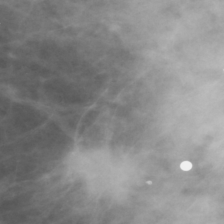

In [567]:
trans.ToPILImage()(og_im[0])

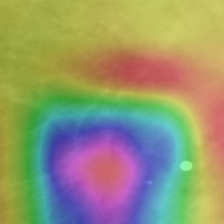

In [570]:
heatmap_on_image

In [569]:
heatmap, heatmap_on_image = apply_colormap_on_image(trans.ToPILImage()(og_im[0]), cam[0], 'hsv')

In [12]:
# Get params
target_layer = 7
target_example = 2  # Snake
(original_image, prep_img, target_class, file_name_to_export_) = get_example_params(target_example)
pretrained_model = learner.models[1][0]
# Grad cam
grad_cam = GradCam(pretrained_model, target_layer=target_layer)
# Generate cam mask
cam = grad_cam.generate_cam(learner.train_ds[0][0][0][None])
# Save mask
#for i in range(grad_cam.model.num_modules): 
#    save_class_activation_images(original_image, cams[i], file_name_to_export_+'_'+str(i))
#print('Grad cam completed')

names_ext = ['_Cam_Heatmap', '_Cam_On_Image', '_Cam_Grayscale']
names = [file_name_to_export + x for x in names_ext]
f, axes = plt.subplots(2, len(names), figsize=(15,15))
        im_path = os.path.join(data_src, 'results', file_name + '_' + str(j) + '.png')
        img = PIL.Image.open(im_path)
        axes[i].imshow(img)
        axes[i].set_xlabel(ext)
        axes[i].set_xticks([])
        axes[i].set_yticks([])
axes[1].set_title('relation of image '+file_name_to_export_+' to label '+ str(target_class) +'. layer:'+str(target_layer))
plt.tight_layout()

NameError: name 'model' is not defined

In [75]:
datasets_dict = {'CIFAR-10': {
        'dataset': datasets.CIFAR10,
        'train_transform': transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomCrop(32, padding=4),
            transforms.ToTensor(),
            transforms.Normalize((0.4914, 0.4822, 0.4465),
                                 (0.2470, 0.2435, 0.2616))
        ]),
        'transform': transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.4914, 0.4822, 0.4465),
                                 (0.2470, 0.2435, 0.2616))
        ]),
            'clean': transforms.Compose([
            transforms.ToTensor()
        ]),
        'dset_kwargs': {},
        'val_size': 10000,
        'distribution': 'categorical',
        'input_shape': (3, 32, 32),
        'output_dim': 10
    }
}
from torch.utils.data.sampler import SubsetRandomSampler

def get_dataloaders_(batch_size, trial_i, dataset='MNIST', augment=False, early_stop=False, use_morph=False, depth=None,
                    n_workers=0):
    data_dir = './data/{}'.format(dataset)

    params = datasets_dict[dataset]

    datasets = {}
    for split in ['train_clean', 'train', 'valid', 'test']:
        if augment and split == 'train' and 'train_transform' in params.keys():
            transform = params['train_transform']
        else:
            transform = params['transform']
        if split=='train_clean':
            transform = params['clean']
                 
        dset = params['dataset'](root=data_dir,
                                 train=(split != 'test'),
                                 download=True,
                                 transform=transform,
                                 **params['dset_kwargs'])
        datasets[split] = dset

    # Deterministic train/val split based on trial number
    if True:
        indices = list(range(len(datasets['train'])))
        val_size = params['val_size']

        s = np.random.RandomState(trial_i)
        valid_idx = s.choice(indices, size=val_size, replace=False)
        train_idx = list(set(indices) - set(valid_idx))

        train_sampler = SubsetRandomSampler(train_idx)
        valid_sampler = SubsetRandomSampler(valid_idx)

    default_dloader_args = {
        'batch_size': batch_size,
        'pin_memory': True,
        'num_workers': n_workers,
        'drop_last': True,
        'shuffle': False
    }

    dataloaders = {}

    # If we're not doing early stopping, don't use a separate validation set
    if early_stop:
        dataloaders['train'] = DataLoader(dataset=datasets['train'],
                                          sampler=train_sampler,
                                          **default_dloader_args)
        dataloaders['valid'] = DataLoader(dataset=datasets['valid'],
                                          sampler=valid_sampler,
                                          **default_dloader_args)
        dataloaders['test'] = DataLoader(dataset=datasets['test'],
                                         shuffle=False,
                                         **default_dloader_args)
        dataloaders['morph'] = None
    else:
        if use_morph:
            train_morph_loader = load_morph_data(batch_size, dataset, depth)
            dataloaders['morph'] = train_morph_loader
        else:
            dataloaders['morph'] = None

        dataloaders['train'] = DataLoader(dataset=datasets['train'],
                                          **default_dloader_args)
        dataloaders['train_clean'] = DataLoader(dataset=datasets['train_clean'],
                                  **default_dloader_args)
        dataloaders['valid'] = DataLoader(dataset=datasets['test'],
                                          **default_dloader_args)
        dataloaders['test'] = DataLoader(dataset=datasets['test'],
                                         **default_dloader_args)

    return dataloaders, params


In [288]:
batch_size = 100
dataset='CIFAR-10'
network = 'densenet-82-8-8'
loaders, _ = get_dataloaders_(batch_size, 0, dataset, False, early_stop=False)
n_models = 3

params = {}
params['densenet-82-8-8']={'num_modules':2,'bottleneck':True,'reduction':0.5,'depth':82,'growth_rate':8,'input_shape':(3, 32, 32),'output_dim':10}
network = 'densenet-82-8-8'
model = DenseNet(input_shape=params[network]['input_shape'],
                     output_dim=params[network]['output_dim'],
                     growth_rate=params[network]['growth_rate'],
                     depth=params[network]['depth'],
                     reduction=params[network]['reduction'],
                     bottleneck=params[network]['bottleneck'],
                     num_modules=n_models)

device = torch.device("cpu")
model = model.to(device) 

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [59]:
MODEL_DIR = 'work_space/save'
UNCORR_MODEL_DIR = '2020-05-05_19:05_resnet50_lr=0.001_m=150_a=0_64_2_pre'
CORR_MODEL_DIR = '2020-05-06_01:22_resnet50_lr=0.001_m=150_a=0.01_64_2_pre'
CORR_MODEL_DIR_2 = '2020-05-06_07:43_resnet50_lr=0.001_m=150_a=0.05_64_2_pre_pre_layers=158_128_71_32_pre_steps=50_50_50_300'
CORR_MODEL_DIR_3 = '2020-05-06_14:03_resnet50_lr=0.001_m=150_a=0.1_64_2_pre_pre_layers=158_128_71_32_pre_steps=50_50_50_300'
rel_dirs = [UNCORR_MODEL_DIR, CORR_MODEL_DIR, CORR_MODEL_DIR_2, CORR_MODEL_DIR_3]
alphas = ['0', '0.01', '0.05', '0.1']

In [44]:
for batch, labels in learner.eval_train:
    batch_roi = torch.cat(batch[1])
    batch = torch.cat(batch[0])
    labels = torch.cat(labels)
    break

In [67]:
batch_roi[labels == 1][0][0]

tensor([[1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 1.,  ..., 0., 0., 0.],
        [1., 1., 1.,  ..., 0., 0., 0.],
        [1., 1., 1.,  ..., 0., 0., 0.]])

In [90]:
class_dir = {0:'bkg', 1:'calc_mal', 2:'mass_mal', 3:'calc_ben', 4:'mass_ben'}
n_models = 2
def new_gen_fig(ind, label_num, target_class):
    counterfact = (label_num != target_class)
    prep_img = batch[labels == label_num][ind].to('cpu')
    original_image = trans.ToPILImage()(prep_img[0])
    roi_image = batch_roi[labels == label_num][ind].to('cpu')
    roi_image = trans.ToPILImage()(roi_image[0])
    file_name_to_export_ = class_dir[label_num]
    for target_layer in [7]:
        f, axes = plt.subplots(n_models, len(rel_dirs), figsize=(15,15))
        for i, (model_path, name) in enumerate(zip(rel_dirs, alphas)):
            fix_str = [x for x in os.listdir(path.join(MODEL_DIR, model_path)) if 'model' in x][0][8:]
            conf.save_path = Path(path.join(MODEL_DIR, model_path))
            learner.load_state(conf, fix_str, model_only=True, from_save_folder=True) #adds a predix 'model_' to name      
            thetas = []
            for j in range(n_models):
                model = learner.models[j][0].to('cpu')
                model.eval() #model.train(mode=False)

                # Grad cam
                grad_cam = GradCam(model, target_layer=target_layer)

                # Generate cam mask
                cam, pred_class, model_output = grad_cam.generate_cam(prep_img[None], target_class, counterfact)
                thetas.append(model_output[0])
                heatmap, heatmap_on_image = apply_colormap_on_image(original_image, cam, 'hsv')
                axes[j][i].imshow(heatmap_on_image)
                axes[j][i].set_xticks([])
                axes[j][i].set_yticks([])
                axes[j][i].set_ylabel(str(pred_class==label_num), fontdict={'size':18})
            mean_pred = np.argmax(torch.stack(thetas).mean(0).detach().numpy()).item()
            axes[j][i].set_xlabel(str(mean_pred == label_num), fontdict={'size':18})    
            axes[0][i].set_xlabel(r'$\alpha$ = ' + name, fontdict={'size':24})
            axes[0][i].xaxis.set_label_position('top')
        relation = 'Relation' if not counterfact else 'Counterfactual'
        axes[0][1].set_title(relation+' of '+class_dir[label_num]+' image to label '+ class_dir[target_class],
                                fontdict={'size':24}, pad=30)
        plt.tight_layout(pad=1)
        f.subplots_adjust(top=.5)
        
        # adding refferance
        plt.figure(figsize=(2,2))
        plt.imshow(np.asarray(roi_image), alpha=.75, cmap='Greens')
        plt.imshow(np.asarray(original_image), alpha=.3, cmap='bone')
        plt.xlabel('roi', fontdict={'size':18})
        plt.xticks([])
        plt.yticks([])        

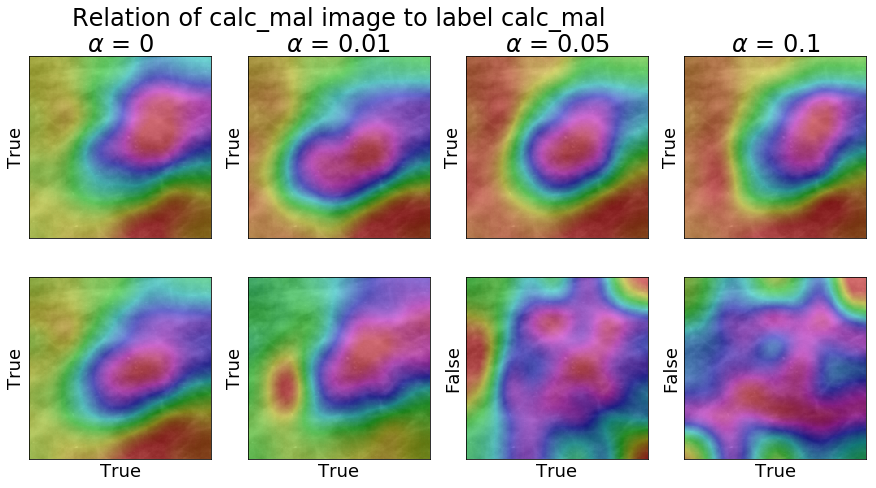

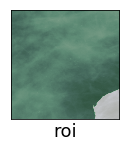

In [91]:
for i in range(1):
    new_gen_fig(i, 1, 1)

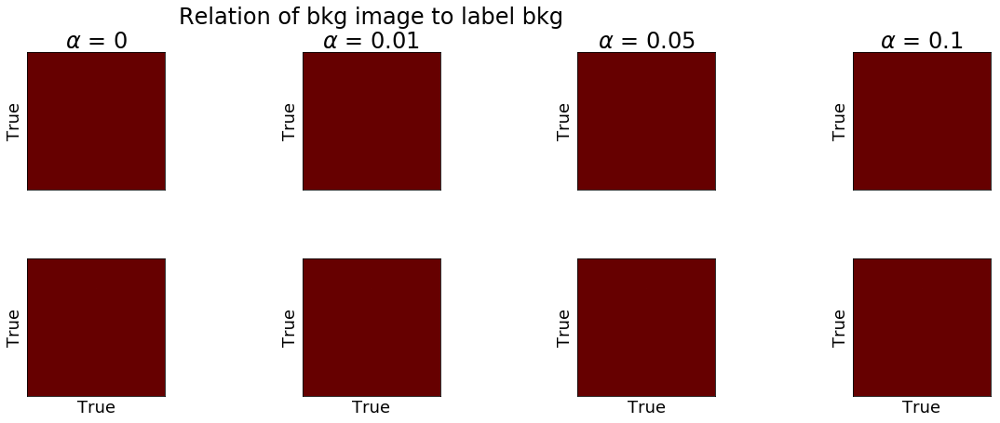

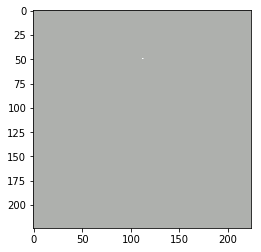

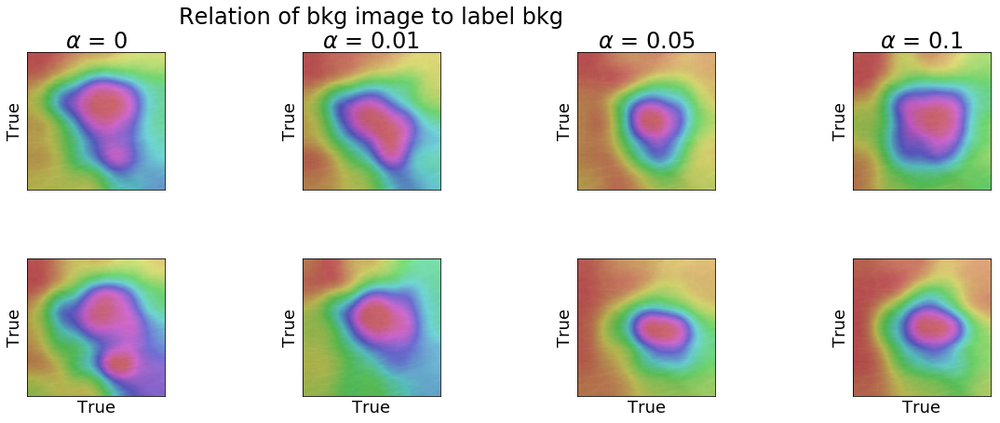

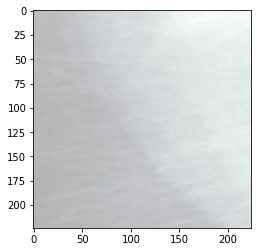

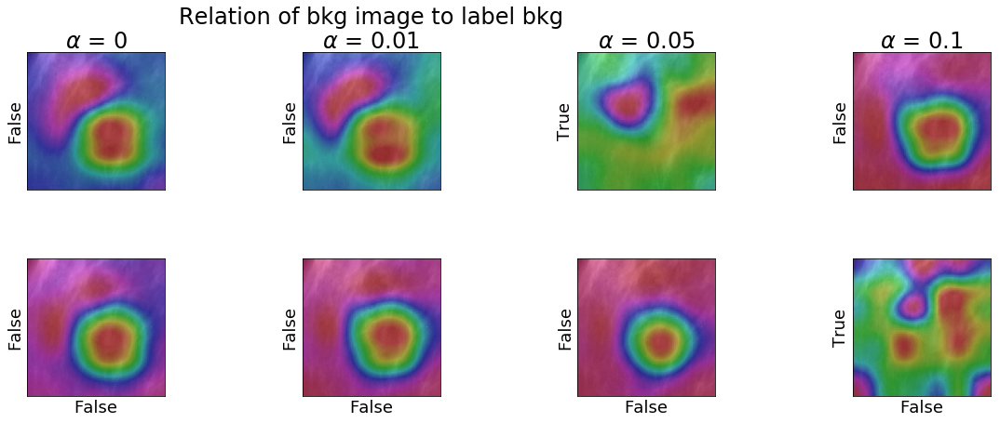

...

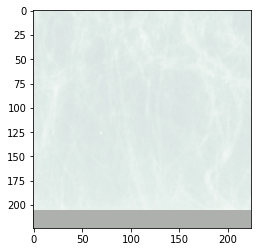

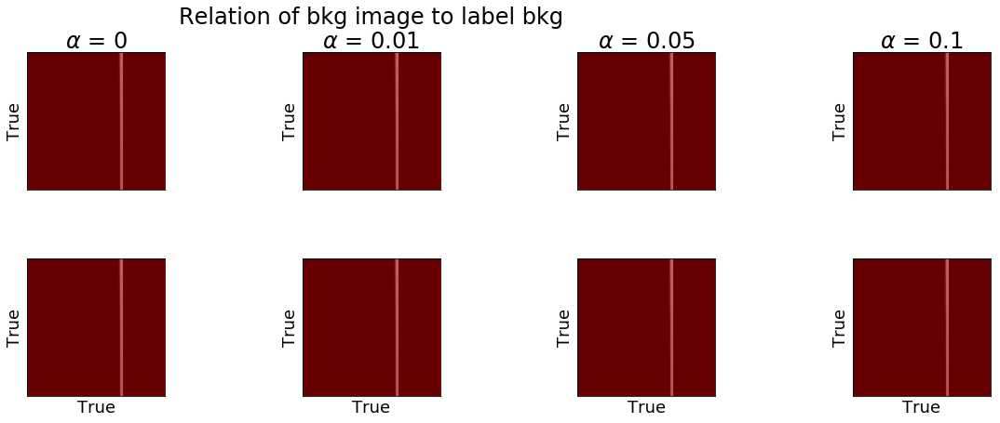

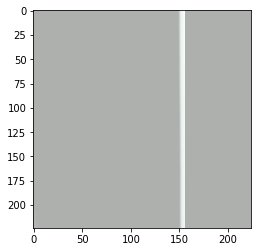

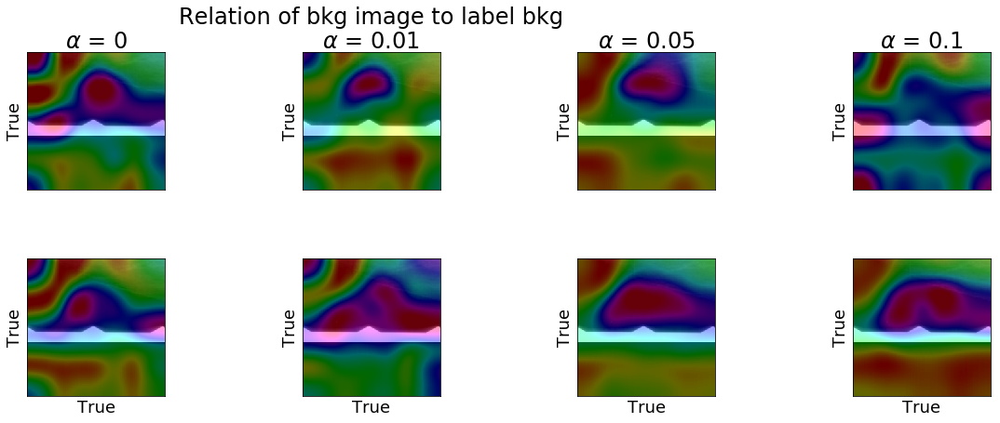

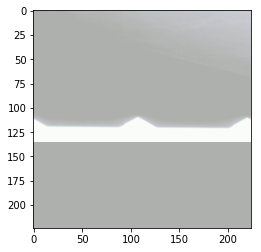

In [79]:
for i in range(20):
    new_gen_fig(i, 0, 0)

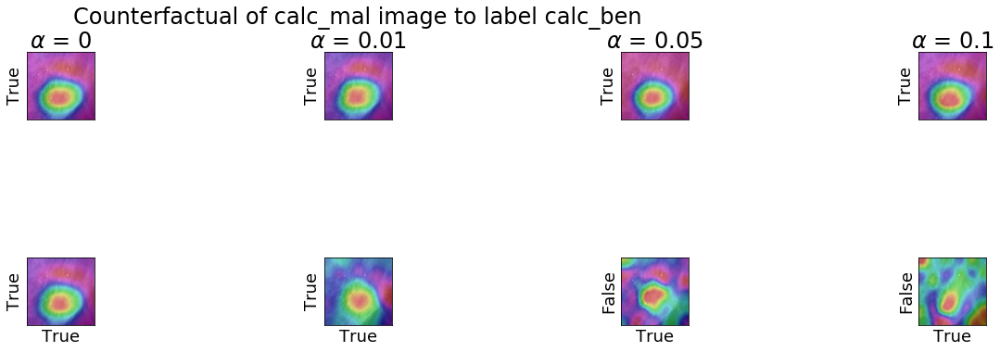

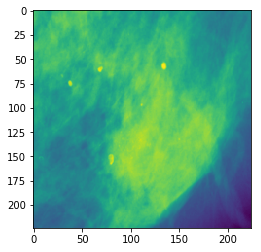

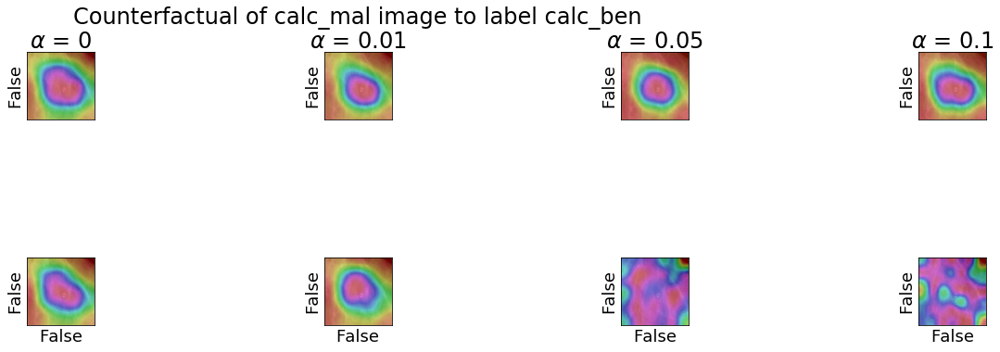

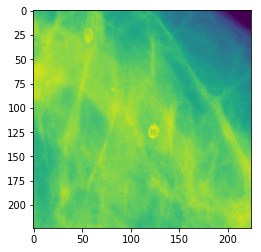

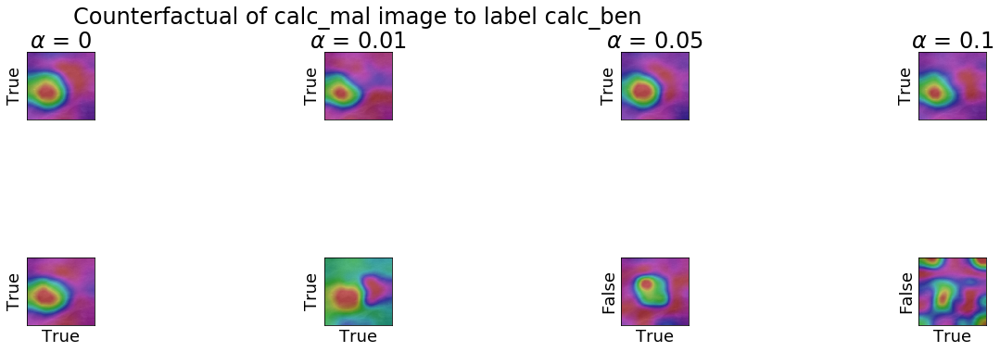

...

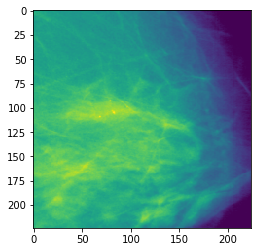

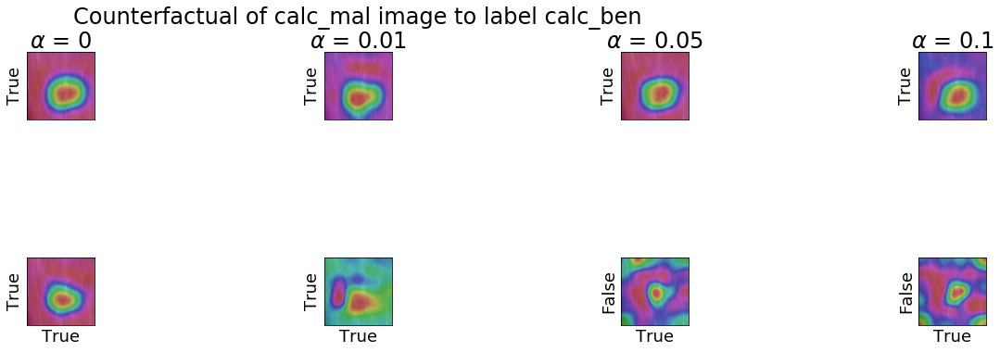

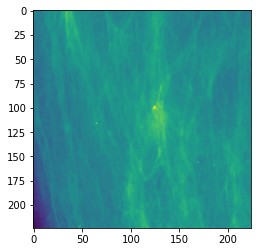

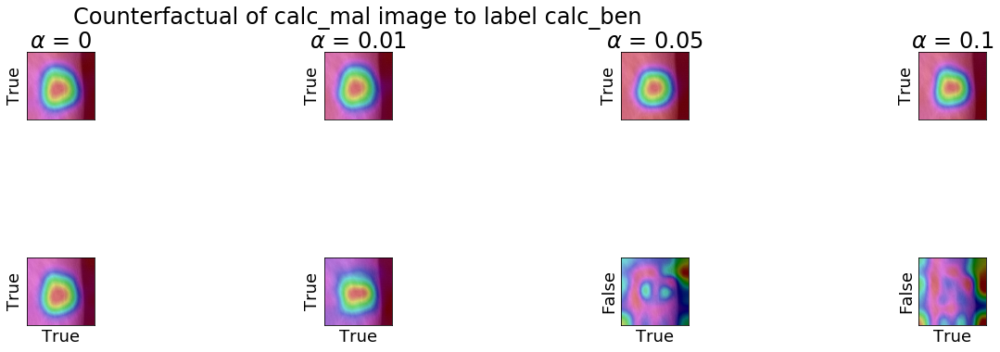

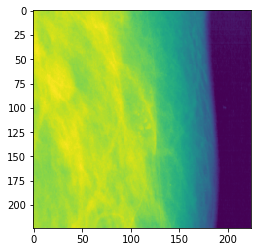

In [611]:
for i in range(10):
    new_gen_fig(i, 1, 3)

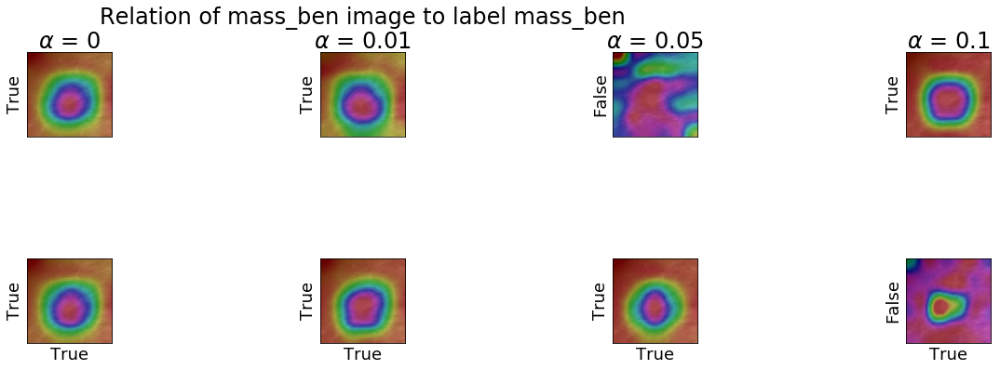

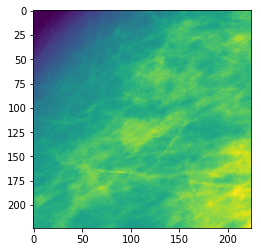

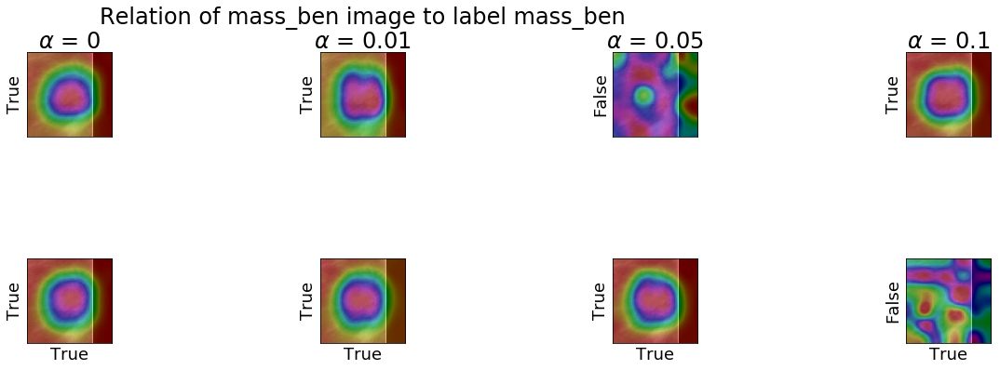

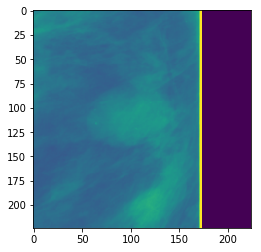

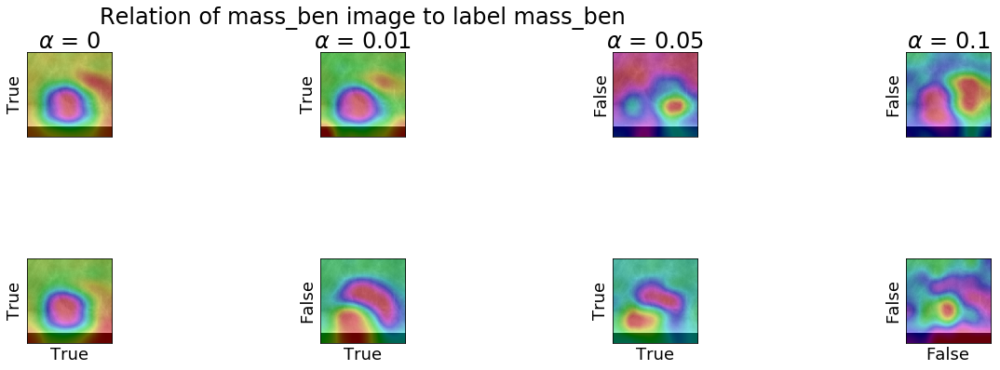

...

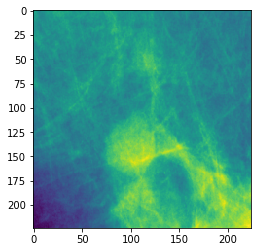

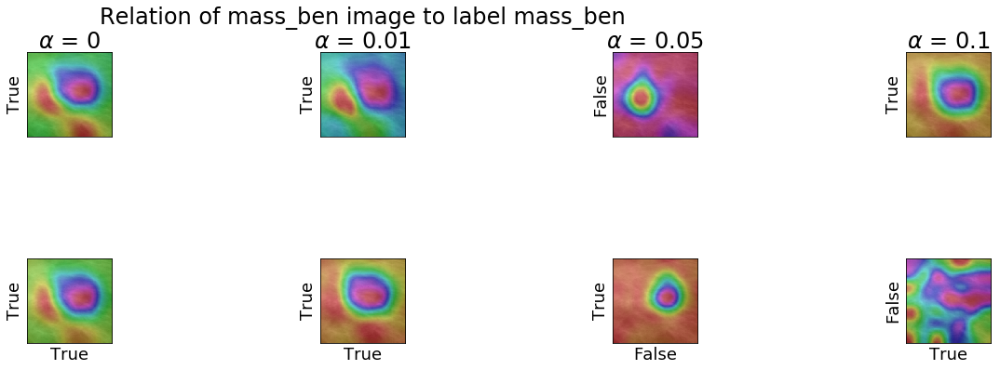

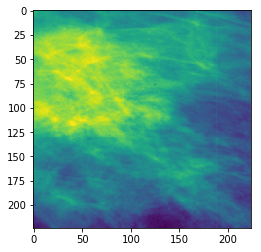

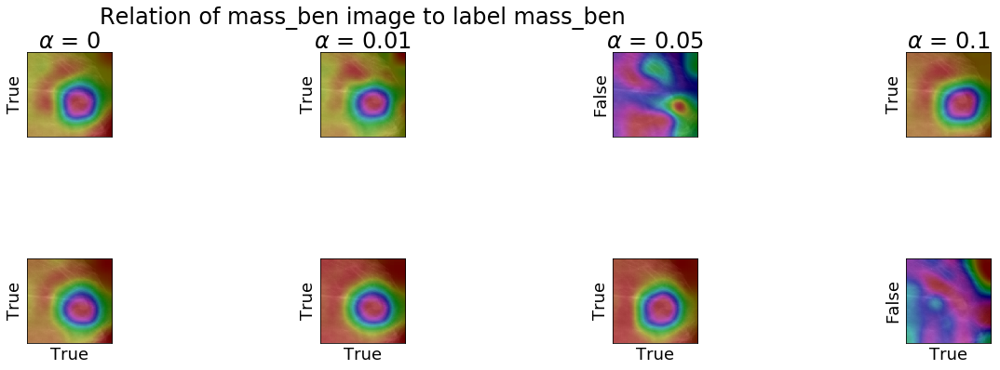

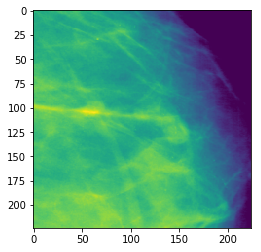

In [612]:
for i in range(10):
    new_gen_fig(i, 4, 4)

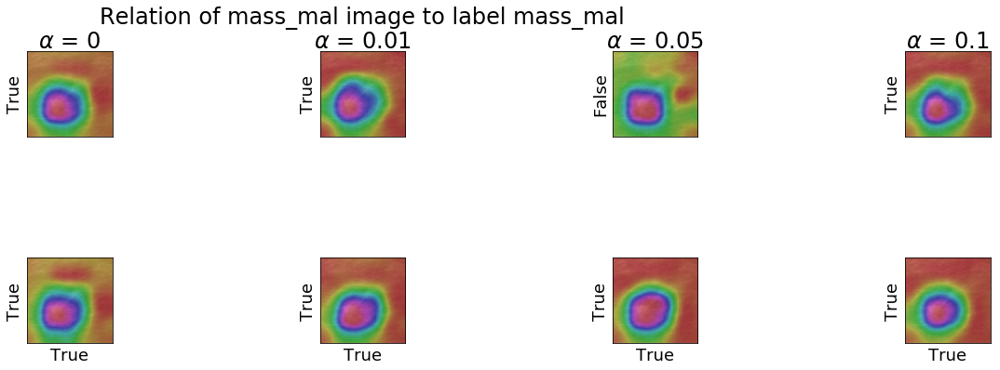

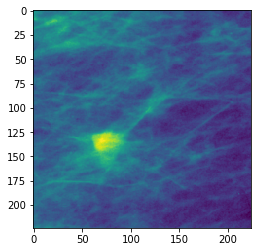

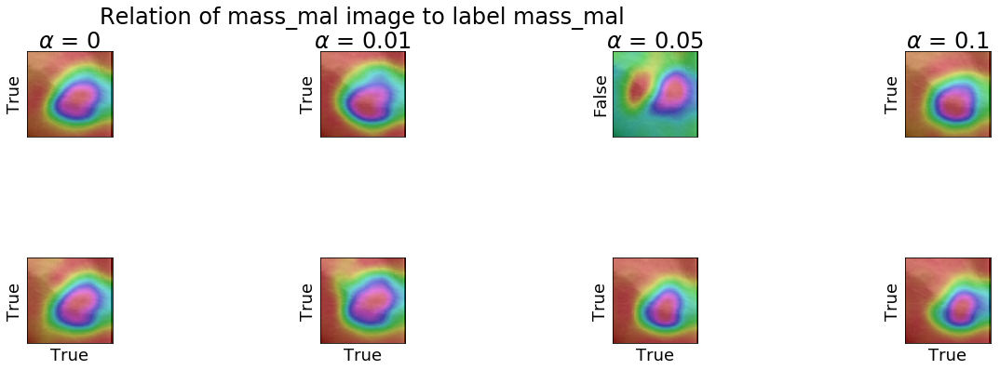

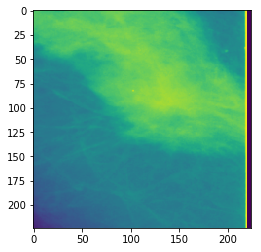

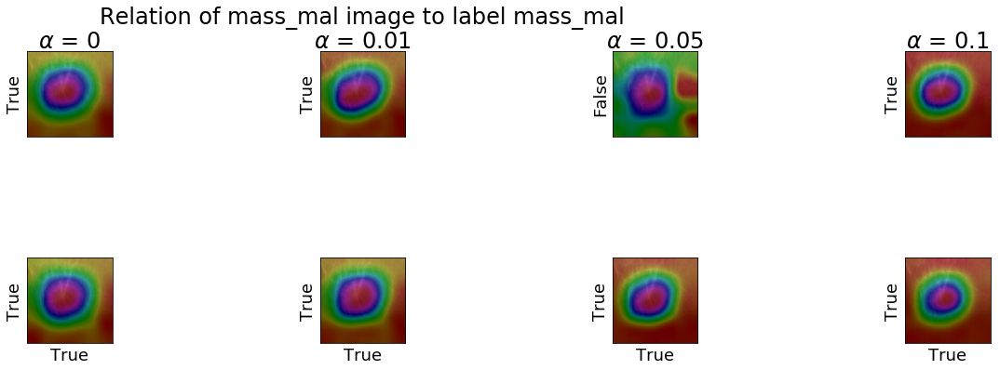

...

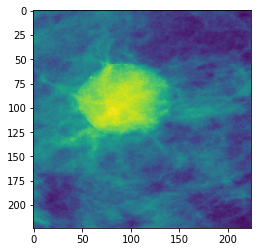

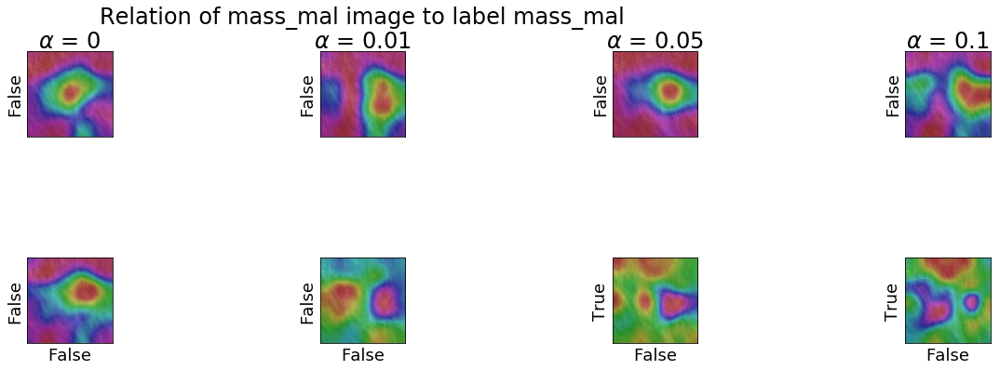

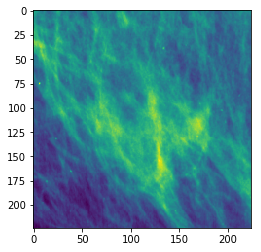

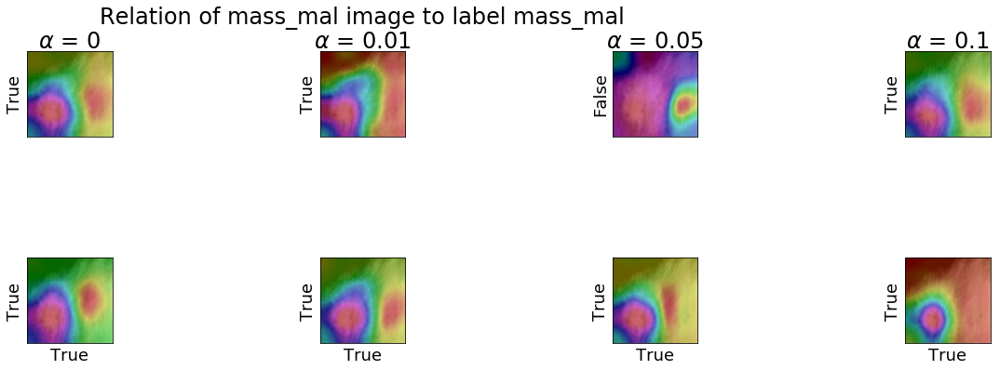

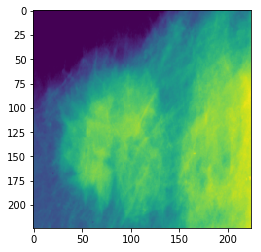

In [613]:
for i in range(10):
    new_gen_fig(i, 2, 2)

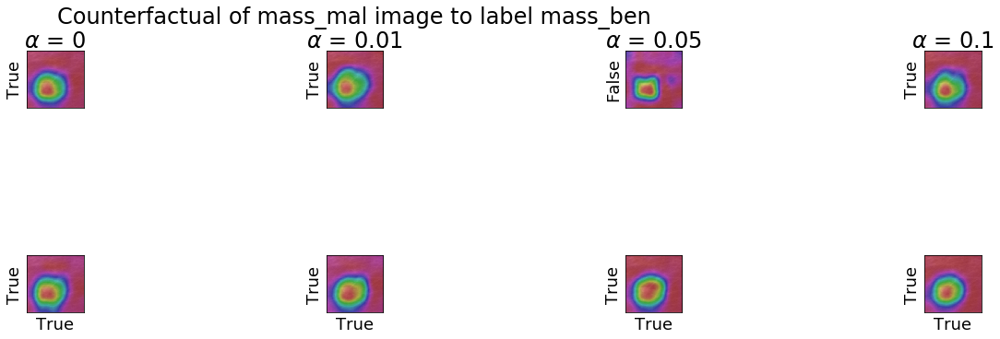

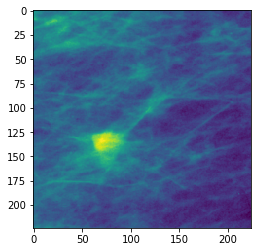

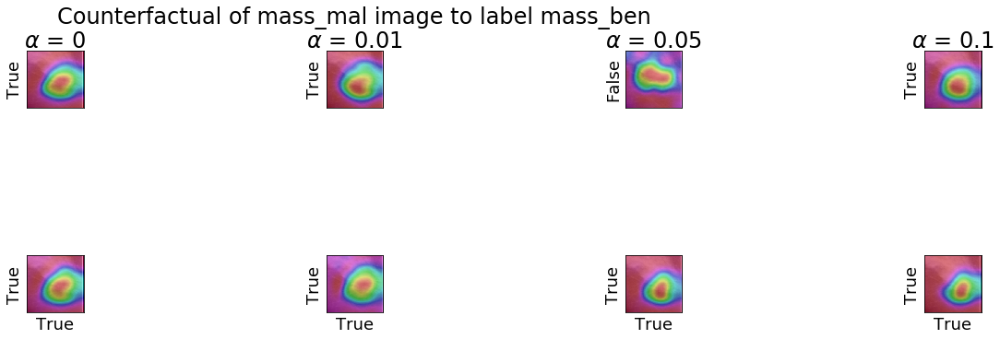

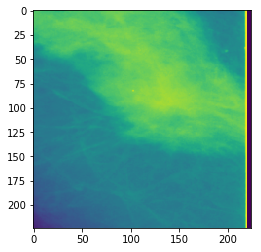

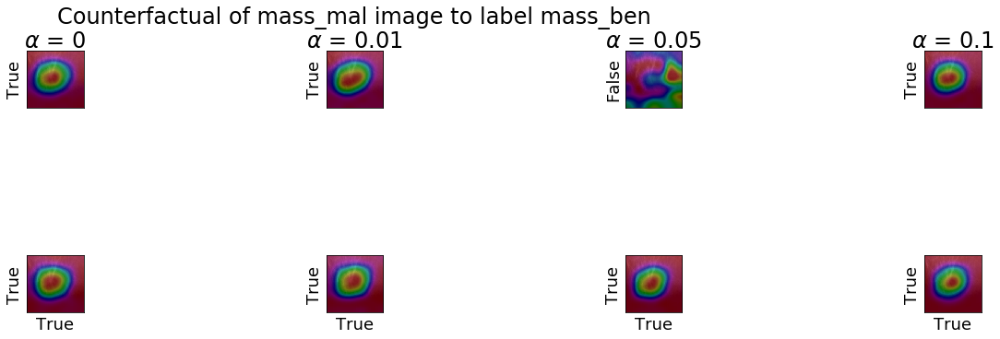

...

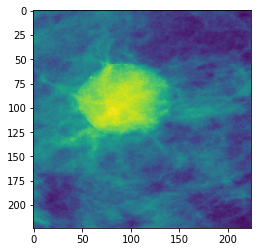

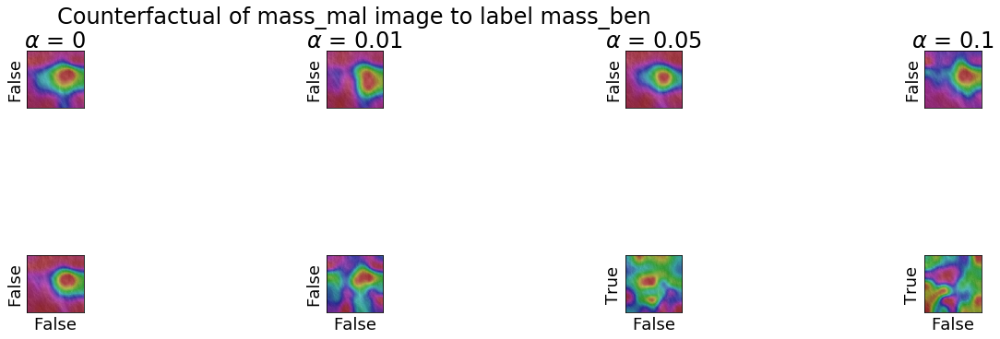

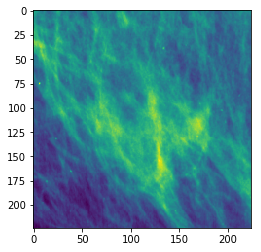

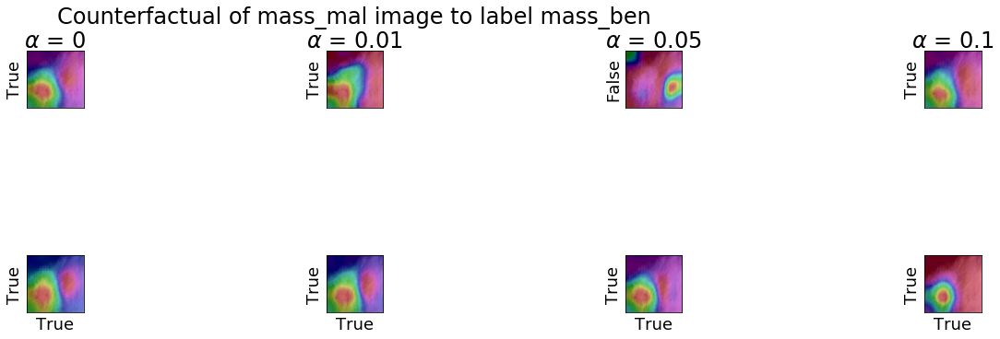

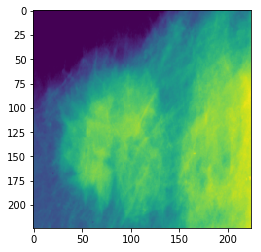

In [614]:
for i in range(10):
    new_gen_fig(i, 2, 4)